# BCI Giuseppe Bonomo HGD

In [1]:
#%%
#!git clone https://github.com/marco-siino/EEG-ATCNet.git
#!git clone https://github.com/Bonomo31/Tesi.git
%pip install mne
%pip install PyWavelets
#Le ulitme versioni non sono compatibili con le librerie usate
#in preprocess_HGD.py, quindi si è optato a utilizzare una versione meno recente
%pip install braindecode==0.3

import os
import sys
import shutil
import time
import pywt
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import scipy.signal as signal
import requests
from pathlib import Path
from tqdm import tqdm


from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import train_test_split
#os.chdir("/content/Tesi/HGD/")
#os.chdir("/Users/giuseppebonomo/Desktop/Tesi/HGD/")
os.chdir("/home/giuseppe_bonomo/DATASET/HGD/")

import models

from preprocess import get_data
#from keras.utils.vis_utils import plot_model

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


2025-05-30 16:57:51.361512: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-30 16:57:51.372763: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748617071.384994  113157 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748617071.388612  113157 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1748617071.398459  113157 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

# Organize the dataset.

In [2]:
#Creo la cartella dataset
os.makedirs("dataset", exist_ok=True)

# Definizione URL base
train_url = "https://gin.g-node.org/robintibor/high-gamma-dataset/raw/master/data/train"
test_url = "https://gin.g-node.org/robintibor/high-gamma-dataset/raw/master/data/test"

# Creazione cartelle se non esistono
train_dir = Path("dataset/train")
test_dir = Path("dataset/test")
train_dir.mkdir(parents=True, exist_ok=True)
test_dir.mkdir(parents=True, exist_ok=True)

def download_file(url, filepath):
    #Scarica un file con una barra di avanzamento
    response = requests.get(url, stream=True)
    if response.status_code == 200:
        total_size = int(response.headers.get("content-length", 0))
        with open(filepath, "wb") as f, tqdm(
            desc=filepath.name, total=total_size, unit="B", unit_scale=True
        ) as bar:
            for chunk in response.iter_content(chunk_size=1024):
                f.write(chunk)
                bar.update(len(chunk))
    else:
        print(f"Errore nel download di {url}: {response.status_code}")

#Scarico i dati di train e test per High Gamma Dataset controllo se esistono già
if not os.path.exists("dataset/train/1.mat"):
    # Scarico i file di train e test
    for i in range(1, 15):
        train_file = train_dir / f"{i}.mat"
        test_file = test_dir / f"{i}.mat"

        download_file(f"{train_url}/{i}.mat", train_file)
        download_file(f"{test_url}/{i}.mat", test_file)

    print("Download completato!")
else:
    print("I dati sono già presenti")


I dati sono già presenti


# Functions definitions

In [3]:
#%%
def draw_learning_curves(history, sub):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy - subject: ' + str(sub))
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'val'], loc='upper left')
    plt.show()
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss - subject: ' + str(sub))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'val'], loc='upper left')
    plt.show()
    plt.close()

def draw_confusion_matrix(cf_matrix, sub, results_path, classes_labels):
    # Generate confusion matrix plot
    display_labels = classes_labels
    disp = ConfusionMatrixDisplay(confusion_matrix=cf_matrix,
                                display_labels=display_labels)
    disp.plot()
    disp.ax_.set_xticklabels(display_labels, rotation=12)
    plt.title('Confusion Matrix of Subject: ' + sub )
    plt.savefig(results_path + '/subject_' + sub + '.png')
    plt.show()

def draw_performance_barChart(num_sub, metric, label):
    fig, ax = plt.subplots()
    x = list(range(1, num_sub+1))
    ax.bar(x, metric, 0.5, label=label)
    ax.set_ylabel(label)
    ax.set_xlabel("Subject")
    ax.set_xticks(x)
    ax.set_title('Model '+ label + ' per subject')
    ax.set_ylim([0,1])

# Preprocessing functions definition

## DB4 (Soft -> Threshold 5.5)

In [4]:
import numpy as np
import pywt

def db4_soft(signals, wavelet='db4', level=4, threshold=5.5):
    """
    Drop‐in replacement per il tuo preprocessing:
    – Accetta in ingresso un array di shape (N,1,3,750) o (1,3,750)
    – Applica DWT + hard‐threshold per canale
    – Restituisce un array della stessa shape, senza ricostruzione nel tempo,
      ma con i coefficienti sogliati "ripiegati" a 750 campioni.
    """
    arr = np.asarray(signals)
    # --- caso batch: (N,1,3,750) ---
    if arr.ndim == 4:
        N = arr.shape[0]
        out = [db4_soft(arr[i], wavelet, level, threshold) for i in range(N)]
        return np.stack(out, axis=0)

    # a questo punto arr.ndim == 3 → (1,3,750) o (3,750)
    # estraggo la parte (3,750)
    if arr.shape[0] == 1:
        sig3 = arr[0]   # (3,750)
    else:
        sig3 = arr      # (3,750)

    # Processing canale‐wise
    out_ch = []
    for ch in range(sig3.shape[0]):
        coeffs = pywt.wavedec(sig3[ch], wavelet, mode='per', level=level)
        # hard‐threshold
        coeffs_thr = [coeffs[0]]
        for d in coeffs[1:]:
            coeffs_thr.append(np.where(np.abs(d) < threshold, 0, d))
        # flatten + truncate/pad a 750
        feats1d = np.concatenate([c.ravel() for c in coeffs_thr])
        L = sig3.shape[-1]
        if feats1d.size >= L:
            feats1d = feats1d[:L]
        else:
            feats1d = np.pad(feats1d, (0, L - feats1d.size), 'constant')
        out_ch.append(feats1d)

    # ricompongo shape (1,3,750)
    processed = np.stack(out_ch, axis=0)[np.newaxis, ...]
    return processed


## DB4 (Hard -> Threshold 10.5)

In [5]:
def db4_hard(signal, wavelet='db4', level=4, threshold=10.5):
    """
    Drop‐in replacement per il tuo preprocessing:
    – Accetta in ingresso un array di shape (N,1,3,750) o (1,3,750)
    – Applica DWT + hard‐threshold per canale
    – Restituisce un array della stessa shape, senza ricostruzione nel tempo,
      ma con i coefficienti sogliati "ripiegati" a 750 campioni.
    """
    arr = np.asarray(signal)
    # --- caso batch: (N,1,3,750) ---
    if arr.ndim == 4:
        N = arr.shape[0]
        out = [db4_soft(arr[i], wavelet, level, threshold) for i in range(N)]
        return np.stack(out, axis=0)

    # a questo punto arr.ndim == 3 → (1,3,750) o (3,750)
    # estraggo la parte (3,750)
    if arr.shape[0] == 1:
        sig3 = arr[0]   # (3,750)
    else:
        sig3 = arr      # (3,750)

    # Processing canale‐wise
    out_ch = []
    for ch in range(sig3.shape[0]):
        coeffs = pywt.wavedec(sig3[ch], wavelet, mode='per', level=level)
        # hard‐threshold
        coeffs_thr = [coeffs[0]]
        for d in coeffs[1:]:
            coeffs_thr.append(np.where(np.abs(d) < threshold, 0, d))
        # flatten + truncate/pad a 750
        feats1d = np.concatenate([c.ravel() for c in coeffs_thr])
        L = sig3.shape[-1]
        if feats1d.size >= L:
            feats1d = feats1d[:L]
        else:
            feats1d = np.pad(feats1d, (0, L - feats1d.size), 'constant')
        out_ch.append(feats1d)

    # ricompongo shape (1,3,750)
    processed = np.stack(out_ch, axis=0)[np.newaxis, ...]
    return processed


## RDWT

In [6]:
import numpy as np
import pywt

def rational_dilated_wavelet_transform(sig, wavelet='db4', levels=4):
    """
    Applica la RDWT (Discrete Wavelet Transform dilatata) a un segnale EEG multidimensionale,
    estrae i coefficienti di dettaglio, li interpola tra loro e li "appiattisce" in un vettore
    di lunghezza pari al numero di campioni originali.

    Args:
        sig: array numpy di forma (eventi, 1, canali, campioni)
        wavelet: tipo di wavelet (default 'db4')
        levels: numero di livelli di decomposizione (default 4)

    Returns:
        features: array di forma (eventi, 1, canali, campioni)
                  contenente il “flattened scalogram” interpolato
    """
    eventi, _, canali, campioni = sig.shape
    out = np.zeros_like(sig)

    for e in range(eventi):
        for c in range(canali):
            x = sig[e, 0, c, :]
            # 1) decomposizione wavelet
            coeffs = pywt.wavedec(x, wavelet=wavelet, level=levels, mode='per')
            dettagli = coeffs[1:]  # salta l'approssimazione

            # 2) trova la massima lunghezza tra i livelli
            max_len = max(len(d) for d in dettagli)

            # 3) interpola ogni dettaglio a max_len
            dettagli_riscalati = []
            for d in dettagli:
                x_old = np.arange(len(d))
                x_new = np.linspace(0, len(d) - 1, max_len)
                d_interp = np.interp(x_new, x_old, d)
                dettagli_riscalati.append(d_interp)

            # 4) costruisci il “scalogramma” 2D e poi appiattiscilo
            scalogramma = np.vstack(dettagli_riscalati)      # shape (levels, max_len)
            flattened = scalogramma.flatten()                # shape (levels * max_len,)

            # 5) ricampiona il flattened a lunghezza = campioni
            x_old = np.arange(len(flattened))
            x_new = np.linspace(0, len(flattened) - 1, campioni)
            feature_vec = np.interp(x_new, x_old, flattened)

            out[e, 0, c, :] = feature_vec

    return out

# RDWT normalized with min-max

In [7]:
def normalize_min_max(sig, reconstructed):
    """
    Normalizza il segnale ricostruito usando la normalizzazione Min-Max,
    riportandolo alla scala del segnale di input.

    Args:
    - sig: array numpy di forma (eventi, 1, canali, campioni), segnale di input
    - reconstructed: array numpy di forma (eventi, 1, canali, campioni), segnale ricostruito

    Returns:
    - Segnale ricostruito normalizzato sulla scala dell'input
    """
    min_input = np.min(sig, axis=-1, keepdims=True)
    max_input = np.max(sig, axis=-1, keepdims=True)

    min_reconstructed = np.min(reconstructed, axis=-1, keepdims=True)
    max_reconstructed = np.max(reconstructed, axis=-1, keepdims=True)

    # Evita la divisione per zero
    range_reconstructed = max_reconstructed - min_reconstructed
    range_reconstructed[range_reconstructed == 0] = 1

    normalized = (reconstructed - min_reconstructed) / range_reconstructed

    # Riporta alla scala originale
    scaled = normalized * (max_input - min_input) + min_input

    return scaled

## STFT

In [8]:
import numpy as np
from scipy.signal import stft

def apply_stft(data, fs=256, nperseg=64, noverlap=32, nfft=128, threshold=0.1):
    """
    Drop-in STFT: restituisce modulo sogliato “ripiegato” a (E,1,C,N).

    Args:
      - data: (E,1,C,N)
    Returns:
      - out: (E,1,C,N)
    """
    arr = np.asarray(data)
    E, _, C, N = arr.shape
    out = np.zeros_like(arr)
    for e in range(E):
        for c in range(C):
            x = arr[e,0,c,:]
            f, t, Z = stft(x, fs=fs, nperseg=nperseg,
                           noverlap=noverlap, nfft=nfft)
            mag = np.abs(Z)
            mag[mag < threshold] = 0
            feats = mag.ravel()
            # slice/pad a N
            if feats.size >= N:
                feats1d = feats[:N]
            else:
                feats1d = np.pad(feats, (0, N - feats.size), 'constant')
            out[e,0,c,:] = feats1d
    return out


# Apply Preprocessing

In [9]:
def apply_preprocessing (signals_data, preprocessing):
  if preprocessing=="none":
    return signals_data
  elif preprocessing=="db4_soft":
    return db4_soft(signals_data)
  elif preprocessing=="db4_hard":
    return db4_hard(signals_data)
  elif preprocessing=="rdwt":
    return rational_dilated_wavelet_transform(signals_data)
  elif preprocessing=="rdwt_normalized":
    reconstructed = rational_dilated_wavelet_transform(signals_data)
    return normalize_min_max(signals_data, reconstructed)
  elif preprocessing=="stft":
    return apply_stft(signals_data)


# Model training function

In [10]:
#%% Training
def train(dataset_conf, train_conf, results_path):

    # remove the 'result' folder before training
    if os.path.exists(results_path):
        # Remove the folder and its contents
        shutil.rmtree(results_path)
        os.makedirs(results_path)

    # Get the current 'IN' time to calculate the overall training time
    in_exp = time.time()
    # Create a file to store the path of the best model among several runs
    best_models = open(results_path + "/best models RockNetX.txt", "w")
    # Create a file to store performance during training
    log_write = open(results_path + "/log RockNetX.txt", "w")

    # Get dataset parameters
    dataset = dataset_conf.get('name')
    n_sub = dataset_conf.get('n_sub')
    data_path = dataset_conf.get('data_path')
    isStandard = dataset_conf.get('isStandard')
    LOSO = dataset_conf.get('LOSO')
    # Get training hyperparamters
    batch_size = train_conf.get('batch_size')
    epochs = train_conf.get('epochs')
    signal_preprocessing = dataset_conf.get('signal_preprocessing')
    patience = train_conf.get('patience')
    lr = train_conf.get('lr')
    LearnCurves = train_conf.get('LearnCurves') # Plot Learning Curves?
    n_train = train_conf.get('n_train')
    model_name = train_conf.get('model')
    from_logits = train_conf.get('from_logits')

    # Initialize variables
    acc = np.zeros((n_sub, n_train))
    kappa = np.zeros((n_sub, n_train))

    # Iteration over subjects
    # for sub in range(n_sub-1, n_sub): # (num_sub): for all subjects, (i-1,i): for the ith subject.
    for sub in range(n_sub): # (num_sub): for all subjects, (i-1,i): for the ith subject.

        print('\nTraining on subject ', sub+1)
        log_write.write( '\nTraining on subject '+ str(sub+1) +'\n')
        # Initiating variables to save the best subject accuracy among multiple runs.
        BestSubjAcc = 0
        bestTrainingHistory = []

        # Get training and validation data
        X_train, _, y_train_onehot, _, _, _ = get_data(
            data_path, sub, dataset, LOSO = LOSO, isStandard = isStandard)

        # Divide the training data into training and validation
        X_train, X_val, y_train_onehot, y_val_onehot = train_test_split(X_train, y_train_onehot, test_size=0.2, random_state=42)


        print("\n\nBefore preprocessing X_train shape is:"+str(X_train.shape))
        print("Before preprocessing X_val shape is:"+str(X_val.shape))
        
        X_train = apply_preprocessing(X_train, preprocessing=signal_preprocessing)
        X_val = apply_preprocessing(X_val, preprocessing=signal_preprocessing)
        
        print("\n\nAfter preprocessing X_train shape is:"+str(X_train.shape))
        print("After preprocessing X_val shape is:"+str(X_val.shape))


        # Iteration over multiple runs
        for train in range(n_train): # How many repetitions of training for subject i.
            # Set the random seed for TensorFlow and NumPy random number generator.
            # The purpose of setting a seed is to ensure reproducibility in random operations.
            tf.random.set_seed(train+1)
            np.random.seed(train+1)

            # Get the current 'IN' time to calculate the 'run' training time
            in_run = time.time()

            # Create folders and files to save trained models for all runs
            filepath = results_path + '/saved models/run-{}'.format(train+1)
            if not os.path.exists(filepath):
                os.makedirs(filepath)
            filepath = filepath + '/subject-{}.weights.h5'.format(sub+1)

            # Create the model
            model = getModel(model_name, dataset_conf, from_logits)
            # Compile and train the model
            model.compile(loss=CategoricalCrossentropy(from_logits=from_logits), optimizer=Adam(learning_rate=lr), metrics=['accuracy'])

            # model.summary()
            # plot_model(model, to_file='plot_model.png', show_shapes=True, show_layer_names=True)

            callbacks = [
                ModelCheckpoint(filepath, monitor='val_loss', verbose=0,
                                save_best_only=True, save_weights_only=True, mode='min'),
                ReduceLROnPlateau(monitor="val_loss", factor=0.50, patience=20, verbose=0, min_lr=0.0001),
                EarlyStopping(monitor='val_loss', verbose=1, mode='min', patience=patience)
            ]
            history = model.fit(X_train, y_train_onehot, validation_data=(X_val, y_val_onehot),
                                epochs=epochs, batch_size=batch_size, callbacks=callbacks, verbose=0)

            # Evaluate the performance of the trained model based on the validation data
            # Here we load the Trained weights from the file saved in the hard
            # disk, which should be the same as the weights of the current model.
            model.load_weights(filepath)
            y_pred = model.predict(X_val)

            if from_logits:
                y_pred = tf.nn.softmax(y_pred).numpy().argmax(axis=-1)
            else:
                y_pred = y_pred.argmax(axis=-1)

            labels = y_val_onehot.argmax(axis=-1)
            acc[sub, train]  = accuracy_score(labels, y_pred)
            kappa[sub, train] = cohen_kappa_score(labels, y_pred)

            # Get the current 'OUT' time to calculate the 'run' training time
            out_run = time.time()
            # Print & write performance measures for each run
            info = 'Subject: {}   seed {}   time: {:.1f} m   '.format(sub+1, train+1, ((out_run-in_run)/60))
            info = info + 'valid_acc: {:.4f}   valid_loss: {:.3f}'.format(acc[sub, train], min(history.history['val_loss']))
            print(info)
            log_write.write(info +'\n')
            # If current training run is better than previous runs, save the history.
            if(BestSubjAcc < acc[sub, train]):
                 BestSubjAcc = acc[sub, train]
                 bestTrainingHistory = history

        # Store the path of the best model among several runs
        best_run = np.argmax(acc[sub,:])
        filepath = '/saved models/run-{}/subject-{}.h5'.format(best_run+1, sub+1)+'\n'
        best_models.write(filepath)

        # Plot Learning curves
        if (LearnCurves == True):
            print('Plot Learning Curves ....... ')
            draw_learning_curves(bestTrainingHistory, sub+1)

    # Get the current 'OUT' time to calculate the overall training time
    out_exp = time.time()

    # Print & write the validation performance using all seeds
    head1 = head2 = '         '
    for sub in range(n_sub):
        head1 = head1 + 'sub_{}   '.format(sub+1)
        head2 = head2 + '-----   '
    head1 = head1 + '  average'
    head2 = head2 + '  -------'
    info = '\n---------------------------------\nValidation performance (acc %):'
    info = info + '\n---------------------------------\n' + head1 +'\n'+ head2
    for run in range(n_train):
        info = info + '\nSeed {}:  '.format(run+1)
        for sub in range(n_sub):
            info = info + '{:.2f}   '.format(acc[sub, run]*100)
        info = info + '  {:.2f}   '.format(np.average(acc[:, run])*100)
    info = info + '\n---------------------------------\nAverage acc - all seeds: '
    info = info + '{:.2f} %\n\nTrain Time  - all seeds: {:.1f}'.format(np.average(acc)*100, (out_exp-in_exp)/(60))
    info = info + ' min\n---------------------------------\n'
    print(info)
    log_write.write(info+'\n')

    # Close open files
    best_models.close()
    log_write.close()


# Evaluation function

In [11]:
#%% Evaluation
def test(model, dataset_conf, results_path, allRuns = True):
    # Open the  "Log" file to write the evaluation results
    log_write = open(results_path + "/log RockNetX.txt", "a")

    # Get dataset paramters
    dataset = dataset_conf.get('name')
    signal_preprocessing = dataset_conf.get('signal_preprocessing')
    n_classes = dataset_conf.get('n_classes')
    n_sub = dataset_conf.get('n_sub')
    data_path = dataset_conf.get('data_path')
    isStandard = dataset_conf.get('isStandard')
    LOSO = dataset_conf.get('LOSO')
    classes_labels = dataset_conf.get('cl_labels')
    #Ripetuto
    #signal_preprocessing = dataset_conf.get('signal_preprocessing')

    # Test the performance based on several runs (seeds)
    runs = os.listdir(results_path+"/saved models")
    # Initialize variables
    acc = np.zeros((n_sub, len(runs)))
    kappa = np.zeros((n_sub, len(runs)))
    cf_matrix = np.zeros([n_sub, len(runs), n_classes, n_classes])

    # Iteration over subjects
    # for sub in range(n_sub-1, n_sub): # (num_sub): for all subjects, (i-1,i): for the ith subject.
    inference_time = 0 #  inference_time: classification time for one trial
    for sub in range(n_sub): # (num_sub): for all subjects, (i-1,i): for the ith subject.
        # Load data
        _, _, _, X_test, _, y_test_onehot = get_data(data_path, sub, dataset, LOSO = LOSO, isStandard = isStandard)

        X_test = apply_preprocessing(X_test, preprocessing=signal_preprocessing)

        # Iteration over runs (seeds)
        for seed in range(len(runs)):
            # Load the model of the seed.
            model.load_weights('{}/saved models/{}/subject-{}.weights.h5'.format(results_path, runs[seed], sub+1))

            inference_time = time.time()
            # Predict MI task
            y_pred = model.predict(X_test).argmax(axis=-1)
            inference_time = (time.time() - inference_time)/X_test.shape[0]
            # Calculate accuracy and K-score
            labels = y_test_onehot.argmax(axis=-1)
            acc[sub, seed]  = accuracy_score(labels, y_pred)
            kappa[sub, seed] = cohen_kappa_score(labels, y_pred)
            # Calculate and draw confusion matrix
            cf_matrix[sub, seed, :, :] = confusion_matrix(labels, y_pred, normalize='true')
            # draw_confusion_matrix(cf_matrix[sub, seed, :, :], str(sub+1), results_path, classes_labels)

    # Print & write the average performance measures for all subjects
    head1 = head2 = '                  '
    for sub in range(n_sub):
        head1 = head1 + 'sub_{}   '.format(sub+1)
        head2 = head2 + '-----   '
    head1 = head1 + '  average'
    head2 = head2 + '  -------'
    info = '\n' + head1 +'\n'+ head2
    info = '\n---------------------------------\nTest performance (acc & k-score):\n'
    info = info + '---------------------------------\n' + head1 +'\n'+ head2
    for run in range(len(runs)):
        info = info + '\nSeed {}: '.format(run+1)
        info_acc = '(acc %)   '
        info_k = '        (k-sco)   '
        for sub in range(n_sub):
            info_acc = info_acc + '{:.2f}   '.format(acc[sub, run]*100)
            info_k = info_k + '{:.3f}   '.format(kappa[sub, run])
        info_acc = info_acc + '  {:.2f}   '.format(np.average(acc[:, run])*100)
        info_k = info_k + '  {:.3f}   '.format(np.average(kappa[:, run]))
        info = info + info_acc + '\n' + info_k
    info = info + '\n----------------------------------\nAverage - all seeds (acc %): '
    info = info + '{:.2f}\n                    (k-sco): '.format(np.average(acc)*100)
    info = info + '{:.3f}\n\nInference time: {:.2f}'.format(np.average(kappa), inference_time * 1000)
    info = info + ' ms per trial\n----------------------------------\n'
    print(info)
    log_write.write(info+'\n')

    # Draw a performance bar chart for all subjects
    draw_performance_barChart(n_sub, acc.mean(1), 'Accuracy')
    draw_performance_barChart(n_sub, kappa.mean(1), 'k-score')
    # Draw confusion matrix for all subjects (average)
    draw_confusion_matrix(cf_matrix.mean((0,1)), 'All', results_path, classes_labels)
    # Close opened file
    log_write.close()

# Model selection and setup

In [ ]:
#%%
def getModel(model_name, dataset_conf, from_logits = False):

    n_classes = dataset_conf.get('n_classes')
    n_channels = dataset_conf.get('n_channels')
    in_samples = dataset_conf.get('in_samples')

    # Select the model
    if(model_name == 'RockNet'):
        # Train using the proposed ATCNet model: https://ieeexplore.ieee.org/document/9852687
        model = models.RockNet_(
            # Dataset parameters
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            # Sliding window (SW) parameter
            n_windows = 5,
            # Attention (AT) block parameter
            attention = 'mha', # Options: None, 'mha','mhla', 'cbam', 'se'
            # Convolutional (CV) block parameters
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.5,
            # Temporal convolutional (TC) block parameters
            tcn_depth = 2,
            tcn_kernelSize = 4,
            tcn_filters = 64,
            tcn_dropout = 0.3,
            tcn_activation='elu',
            )
    elif(model_name == 'RatioWaveNet'):
        model = models.RatioWaveNet(
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            n_windows = 5,
            attention = 'mha',
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.5,
            tcn_depth = 2,
            tcn_kernelSize = 4,
            tcn_filters = 32,
            tcn_dropout = 0.3,
            tcn_activation='elu',
        )
    elif(model_name == 'RockNetB'):
        model = models.RockNetB(
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            n_windows = 5,
            attention = 'mha',
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.5,
            tcn_depth = 2,
            tcn_kernelSize = 4,
            tcn_filters = 32,
            tcn_dropout = 0.3,
            tcn_activation='elu',
        )
    elif(model_name == 'RockNetC'):
        model = models.RockNetC(
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            n_windows = 5,
            attention = 'mha',
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.5,
            tcn_depth = 2,
            tcn_kernelSize = 4,
            tcn_filters = 32,
            tcn_dropout = 0.3,
            tcn_activation='elu',
        )
    elif(model_name == 'RockNetX'):
        model = models.RockNetX(
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            n_windows = 5,
            attention = 'transformer',
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.5,
            tcn_depth = 3,
            tcn_kernelSize = 4,
            tcn_filters = 64,
            tcn_dropout = 0.3,
            tcn_activation='gelu',
        )
    elif(model_name == 'RockNetY'):
        model = models.RockNetY(
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            n_windows = 5,
            attention = 'mha',
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.5,
            tcn_depth = 2,
            tcn_kernelSize = 4,
            tcn_filters = 32,
            tcn_dropout = 0.3,
            tcn_activation='elu',
        )
    elif(model_name == 'RockNetZ'):
        model = models.RockNetZ(
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            n_windows = 5,
            attention = 'mha',
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.5,
            tcn_depth = 2,
            tcn_kernelSize = 4,
            tcn_filters = 32,
            tcn_dropout = 0.3,
            tcn_activation='relu',
        )
    elif(model_name == 'ATCNet'):
        # Train using the proposed ATCNet model: https://ieeexplore.ieee.org/document/9852687
        model = models.ATCNet_(
            # Dataset parameters
            n_classes = n_classes,
            in_chans = n_channels,
            in_samples = in_samples,
            # Sliding window (SW) parameter
            n_windows = 5,
            # Attention (AT) block parameter
            attention = 'mha', # Options: None, 'mha','mhla', 'cbam', 'se'
            # Convolutional (CV) block parameters
            eegn_F1 = 16,
            eegn_D = 2,
            eegn_kernelSize = 64,
            eegn_poolSize = 7,
            eegn_dropout = 0.3,
            # Temporal convolutional (TC) block parameters
            tcn_depth = 2,
            tcn_kernelSize = 4,
            tcn_filters = 32,
            tcn_dropout = 0.3,
            tcn_activation='elu',
            )
    elif(model_name == 'TCNet_Fusion'):
        # Train using TCNet_Fusion: https://doi.org/10.1016/j.bspc.2021.102826
        model = models.TCNet_Fusion(n_classes = n_classes, Chans=n_channels, Samples=in_samples)
    elif(model_name == 'EEGTCNet'):
        # Train using EEGTCNet: https://arxiv.org/abs/2006.00622
        model = models.EEGTCNet(n_classes = n_classes, Chans=n_channels, Samples=in_samples)
    elif(model_name == 'EEGNet'):
        # Train using EEGNet: https://arxiv.org/abs/1611.08024
        model = models.EEGNet_classifier(n_classes = n_classes, Chans=n_channels, Samples=in_samples)
    elif(model_name == 'EEGNeX'):
        # Train using EEGNeX: https://arxiv.org/abs/2207.12369
        model = models.EEGNeX_8_32(n_timesteps = in_samples , n_features = n_channels, n_outputs = n_classes)
    elif(model_name == 'DeepConvNet'):
        # Train using DeepConvNet: https://doi.org/10.1002/hbm.23730
        model = models.DeepConvNet(nb_classes = n_classes , Chans = n_channels, Samples = in_samples)
    elif(model_name == 'ShallowConvNet'):
        # Train using ShallowConvNet: https://doi.org/10.1002/hbm.23730
        model = models.ShallowConvNet(nb_classes = n_classes , Chans = n_channels, Samples = in_samples)
    elif(model_name == 'MBEEG_SENet'):
        # Train using MBEEG_SENet: https://www.mdpi.com/2075-4418/12/4/995
        model = models.MBEEG_SENet(nb_classes = n_classes , Chans = n_channels, Samples = in_samples)

    else:
        raise Exception("'{}' model is not supported yet!".format(model_name))

    return model

# Run the simulation

## Define the run function.

In [ ]:
#%%
def run(signal_preprocessing):
    # Define dataset parameters
    # Options: 'BCI2a','HGD', 'BCI2b'
    dataset = 'HGD'

    if dataset == 'BCI2a':
        in_samples = 1125
        n_channels = 22
        n_sub = 9
        n_classes = 4
        classes_labels = ['Left hand', 'Right hand','Foot','Tongue']
        data_path = 'dataset/' #os.path.expanduser('~') + '/BCI Competition IV/BCI Competition IV-2a/BCI Competition IV 2a mat/'
    elif dataset == 'HGD':
        in_samples = 1125
        n_channels = 44
        n_sub = 14
        n_classes = 4
        classes_labels = ['Right Hand', 'Left Hand','Rest','Feet']
        data_path = 'dataset/' #os.path.expanduser('~') + '/mne_data/MNE-schirrmeister2017-data/robintibor/high-gamma-dataset/raw/master/data/'
    elif dataset == 'BCI2b':
        in_samples = 750
        n_channels = 3
        n_sub = 9
        n_classes = 2
        classes_labels = ['Left hand', 'Right hand']
        data_path = 'dataset/' #os.path.expanduser('~') + '/BCI Competition IV/BCI Competition IV-2b/BCI Competition IV 2b.mat'
    else:
        raise Exception("'{}' dataset is not supported yet!".format(dataset))

    # Create a folder to store the results of the experiment
    results_path = os.getcwd() + "/results_RatioWaveNet"
    if not  os.path.exists(results_path):
      os.makedirs(results_path)   # Create a new directory if it does not exist

    # Set dataset paramters
    dataset_conf = { 'name': dataset, 'n_classes': n_classes, 'cl_labels': classes_labels,
                    'n_sub': n_sub, 'n_channels': n_channels, 'in_samples': in_samples,
                    'data_path': data_path, 'isStandard': True, 'LOSO': False,
                     'signal_preprocessing':signal_preprocessing}

    # Set training hyperparamters
    #AUMENTARE LE EPOCHS
    train_conf = { 'batch_size': 64, 'epochs': 1500, 'patience': 100, 'lr': 0.001,'n_train': 1,
                  'LearnCurves': True, 'from_logits': False, 'model':'RatioWaveNet'}

    # Train the model
    print("Training the model...")
    train(dataset_conf, train_conf, results_path)
    print("Training completed!")

    # Evaluate the model based on the weights saved in the '/results' folder
    model = getModel(train_conf.get('model'), dataset_conf)
    test(model, dataset_conf, results_path)


## RDWT

Training the model...

Training on subject  1
Creating RawArray with float64 data, n_channels=128, n_times=1225545
    Range : 0 ... 1225544 =      0.000 ...  2451.088 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 1225545)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
320 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 320
Durate degli eventi: [ 3725  3510  3705  3790  3545  3625  3650  3555  3815  3660  3990  3965
  3830  3825  3755  3850  3530  3865  3865  3585  3895  3520  3850  3555
  3790  3765  3855  3585  3875  3500

I0000 00:00:1748617104.528318  113157 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 44188 MB memory:  -> device: 0, name: NVIDIA RTX 6000 Ada Generation, pci bus id: 0000:ac:00.0, compute capability: 8.9
I0000 00:00:1748617115.336333  113396 service.cc:152] XLA service 0x73de700038a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748617115.336358  113396 service.cc:160]   StreamExecutor device (0): NVIDIA RTX 6000 Ada Generation, Compute Capability 8.9
2025-05-30 16:58:35.722066: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1748617117.698422  113396 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-05-30 16:58:41.017909: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion

Epoch 346: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step
Subject: 1   seed 1   time: 2.5 m   valid_acc: 0.8906   valid_loss: 0.616
Plot Learning Curves ....... 


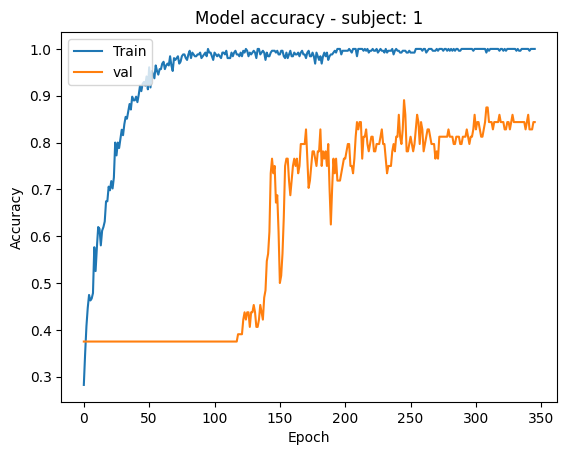

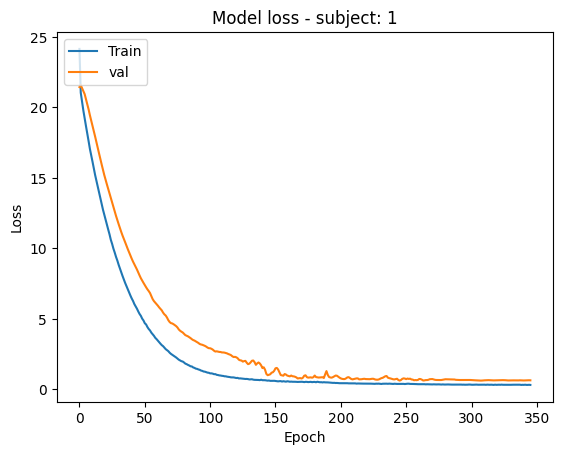


Training on subject  2
Creating RawArray with float64 data, n_channels=128, n_times=3131420
    Range : 0 ... 3131419 =      0.000 ...  6262.838 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3131420)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
813 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 813
Durate degli eventi: [ 3765  3610  3970  3950  3620  3810  3880  3750  3860  3640  3990  3750
  3840  3555  3695  3985  3895  3900  3675  3520  3700  3640  3855  3680
  3890  3565  3590  3575  3655  3965  3645  4000  3915  37

2025-05-30 17:02:28.261484: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:02:47.700477: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Epoch 287: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 572ms/step
Subject: 2   seed 1   time: 2.6 m   valid_acc: 0.7362   valid_loss: 0.872
Plot Learning Curves ....... 


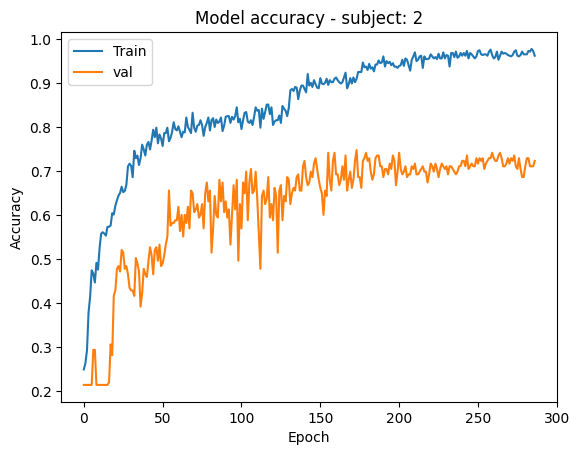

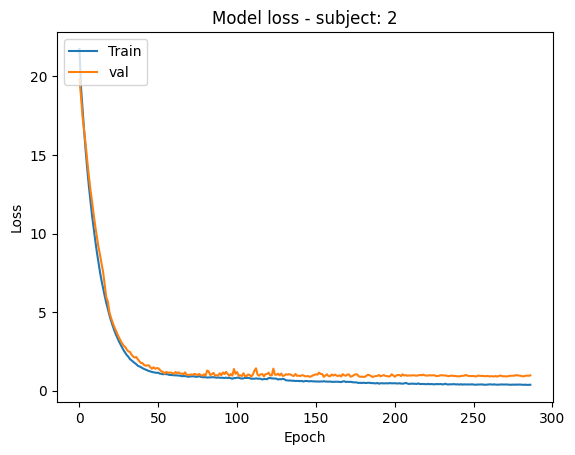


Training on subject  3
Creating RawArray with float64 data, n_channels=128, n_times=3347155
    Range : 0 ... 3347154 =      0.000 ...  6694.308 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3347155)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [3500 3935 3895 3835 3915 3685 3805 3905 3975 3630 4000 3650 3530 3845
 3850 3940 3975 3720 3530 3685 3945 3690 3920 3510 3550 3805 3840 3815
 3845 3910 3615 3525 3925 3590 3835 3855 3770 3815 3885 3850 3

2025-05-30 17:06:13.685783: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 406: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 545ms/step
Subject: 3   seed 1   time: 2.8 m   valid_acc: 0.8636   valid_loss: 0.516
Plot Learning Curves ....... 


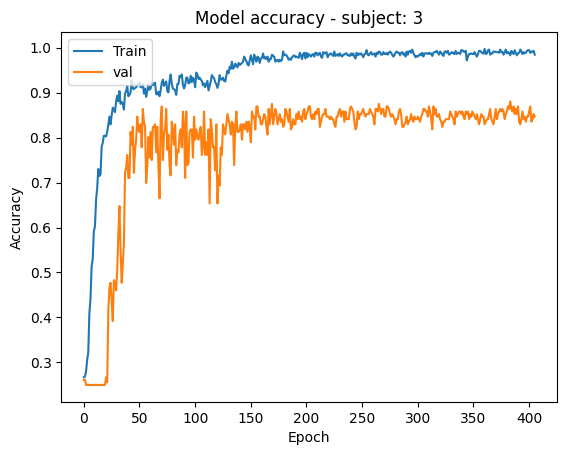

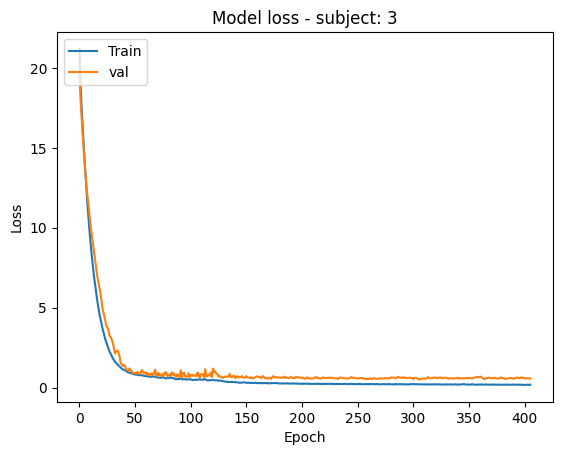


Training on subject  4
Creating RawArray with float64 data, n_channels=128, n_times=3451320
    Range : 0 ... 3451319 =      0.000 ...  6902.638 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3451320)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
897 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 897
Durate degli eventi: [ 3680  3725  3620  3885  3790  3585  3660  3640  3880  3565  3995  3520
  3975  3520  3650  3585  3700  3665  3505  3985  3860  3890  3670  3740
  3675  3830  3995  3690  3520  3955  3935  3580  3835  39

2025-05-30 17:10:20.161287: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:10:25.210632: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_38', 4 bytes spill stores, 4 bytes spill loads

2025-05-30 17:10:40.051793: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Epoch 422: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 521ms/step
Subject: 4   seed 1   time: 3.4 m   valid_acc: 0.9777   valid_loss: 0.147
Plot Learning Curves ....... 


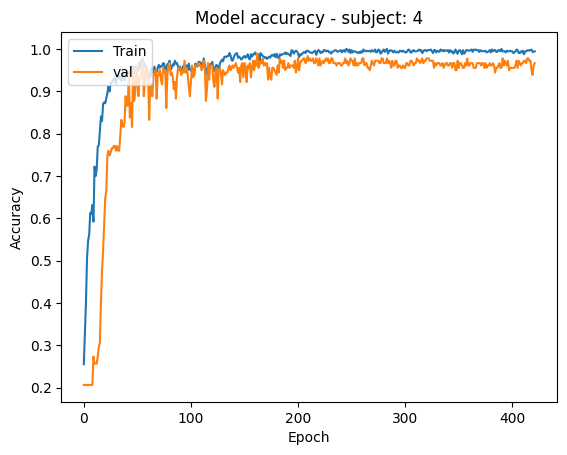

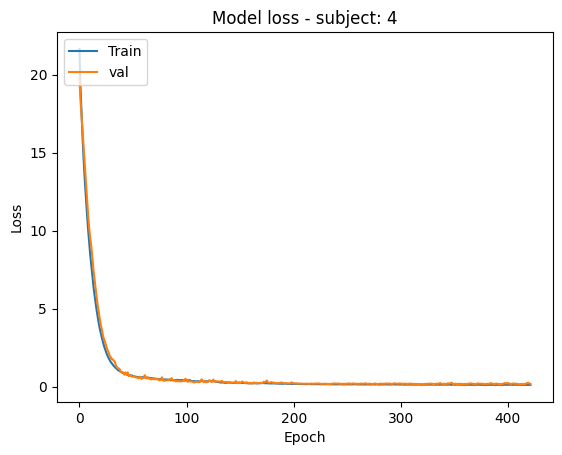


Training on subject  5
Creating RawArray with float64 data, n_channels=128, n_times=2736300
    Range : 0 ... 2736299 =      0.000 ...  5472.598 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 2736300)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
720 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 720
Durate degli eventi: [3740 3800 3525 3635 3775 3825 3990 3860 3735 3870 3790 3660 3580 3965
 3870 3820 3825 3540 3725 3720 3740 3840 3755 4000 3890 3585 3740 3820
 3545 3645 3690 3810 3830 3540 3900 3810 3915 3855 3615 3820 3

2025-05-30 17:14:48.690409: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:15:06.773770: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 239: early stopping
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 417ms/step
Subject: 5   seed 1   time: 2.2 m   valid_acc: 0.7917   valid_loss: 0.747
Plot Learning Curves ....... 


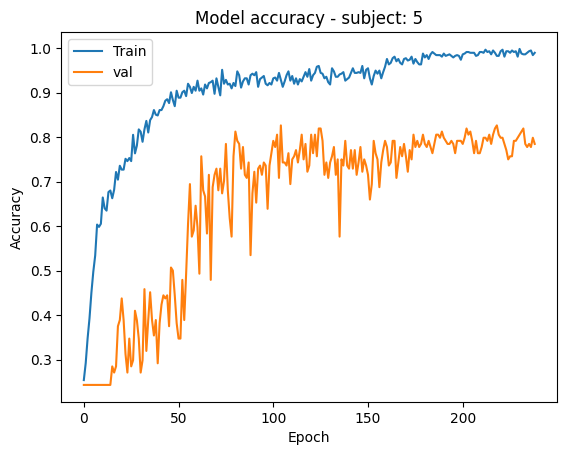

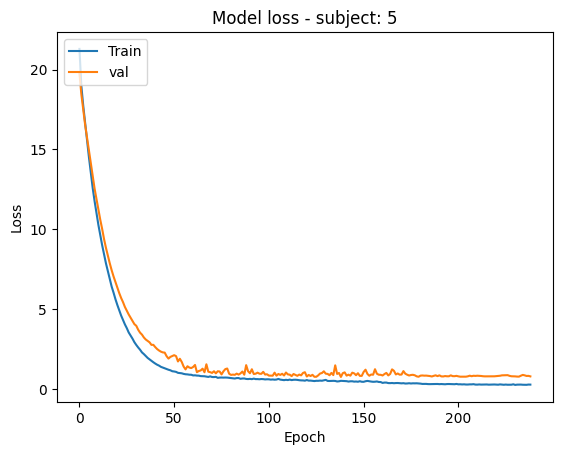


Training on subject  6
Creating RawArray with float64 data, n_channels=128, n_times=3387290
    Range : 0 ... 3387289 =      0.000 ...  6774.578 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3387290)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [ 3730  3525  3860  3950  3965  3940  3720  3860  3995  3620  3500  3685
  3665  3920  3940  3760  3795  3840  3940  3685  3585  3655  3610  3845
  3885  3820  3900  3675  3790  3845  3695  3955  3975  38

2025-05-30 17:18:12.948843: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:18:20.159105: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_38', 4 bytes spill stores, 4 bytes spill loads

2025-05-30 17:18:35.089113: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 243: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 546ms/step
Subject: 6   seed 1   time: 2.4 m   valid_acc: 0.7714   valid_loss: 0.745
Plot Learning Curves ....... 


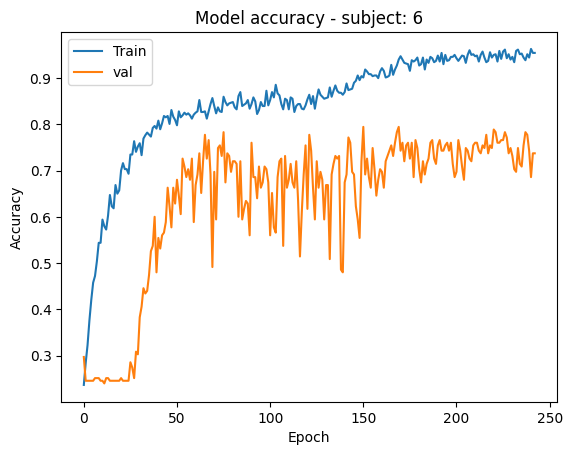

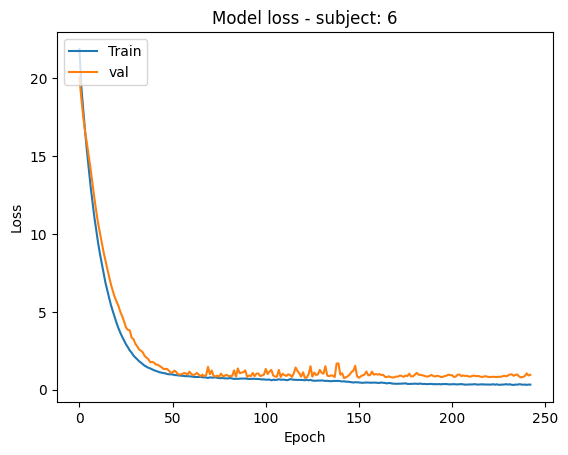


Training on subject  7
Creating RawArray with float64 data, n_channels=128, n_times=3354460
    Range : 0 ... 3354459 =      0.000 ...  6708.918 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3354460)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [3940 3875 3900 3915 3565 3760 3680 3730 3555 3535 3850 3725 3665 3560
 3545 3950 3695 3590 3955 3825 3820 3505 3905 3805 3620 3565 3965 3560
 3575 3520 3875 3640 3710 3705 3575 3630 3905 3695 3995 3655 3

2025-05-30 17:21:53.119199: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:21:59.953113: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_38', 4 bytes spill stores, 4 bytes spill loads

2025-05-30 17:22:13.972934: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Epoch 259: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 397ms/step
Subject: 7   seed 1   time: 2.4 m   valid_acc: 0.8155   valid_loss: 0.612
Plot Learning Curves ....... 


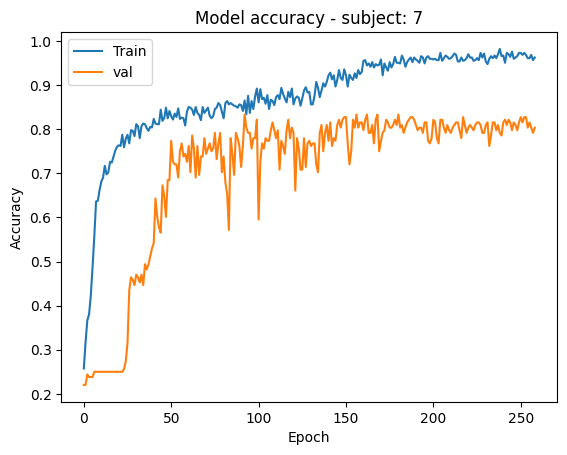

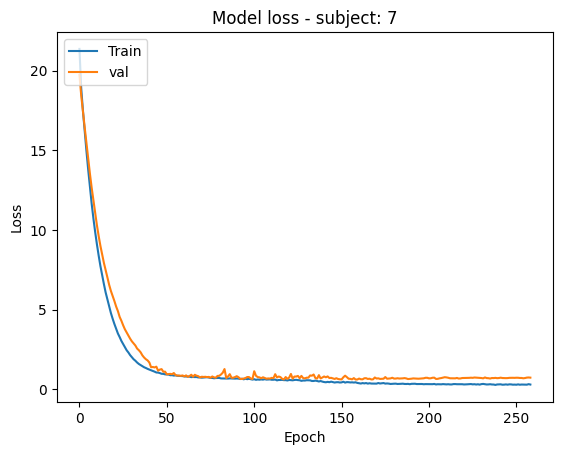


Training on subject  8
Creating RawArray with float64 data, n_channels=128, n_times=2511860
    Range : 0 ... 2511859 =      0.000 ...  5023.718 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 2511860)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
654 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 654
Durate degli eventi: [ 3630  3690  3875  3625  3660  3960  3745  3580  3530  3915  4000  3670
  3670  3750  3655  3635  3575  3715  3580  3650  3510  3880  3930  3735
  3880  3820  3930  3590  3820  3585  3985  3725  3945  39

2025-05-30 17:25:20.164642: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:25:25.830318: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_38', 4 bytes spill stores, 4 bytes spill loads

2025-05-30 17:25:39.992406: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Epoch 407: early stopping
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 432ms/step
Subject: 8   seed 1   time: 2.9 m   valid_acc: 0.7710   valid_loss: 0.700
Plot Learning Curves ....... 


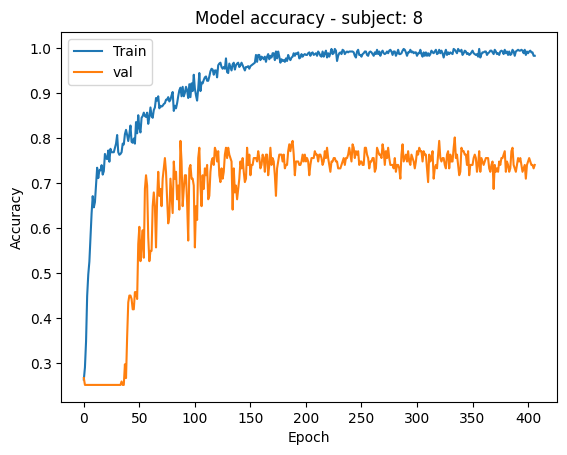

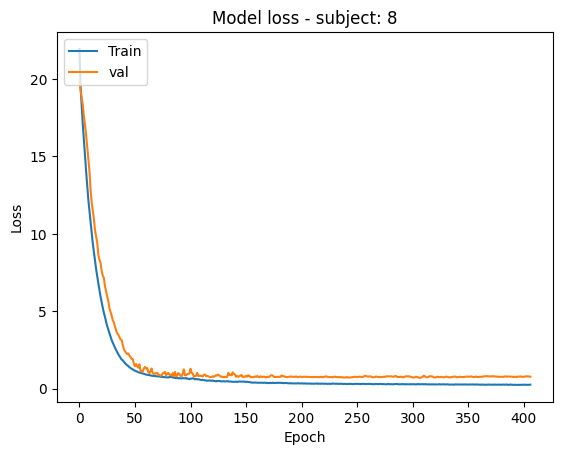


Training on subject  9
Creating RawArray with float64 data, n_channels=128, n_times=3383655
    Range : 0 ... 3383654 =      0.000 ...  6767.308 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3383655)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [ 3965  3890  3605  3630  3535  3575  3500  3885  3645  3875  3880  3870
  3825  3720  3740  3620  3770  4000  3830  3750  3570  3890  3615  3910
  3695  3645  3950  3870  3650  3810  3690  3585  3690  38

2025-05-30 17:29:27.401114: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 264: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 349ms/step
Subject: 9   seed 1   time: 2.1 m   valid_acc: 0.7670   valid_loss: 0.911
Plot Learning Curves ....... 


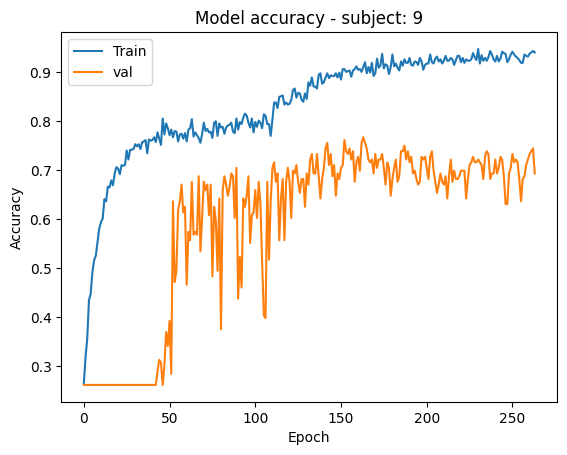

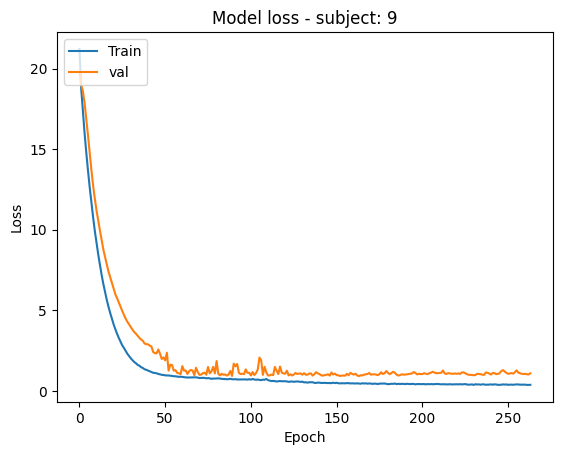


Training on subject  10
Creating RawArray with float64 data, n_channels=128, n_times=3386150
    Range : 0 ... 3386149 =      0.000 ...  6772.298 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3386150)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [ 3985  3785  3815  3995  3505  3590  3885  3715  3700  3915  3595  3870
  4000  3595  3845  3805  3925  3915  3590  3540  3760  3830  3615  3710
  3825  3790  3925  3560  3605  3980  3570  3935  3510  3

2025-05-30 17:32:48.443072: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:32:54.034102: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_38', 4 bytes spill stores, 4 bytes spill loads

2025-05-30 17:33:08.569046: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Epoch 276: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 483ms/step
Subject: 10   seed 1   time: 2.5 m   valid_acc: 0.8598   valid_loss: 0.631
Plot Learning Curves ....... 


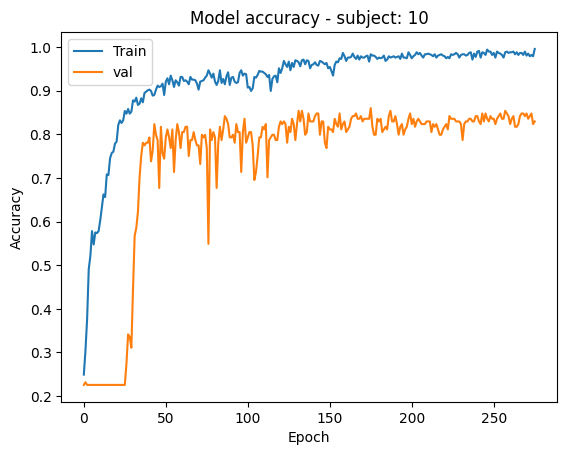

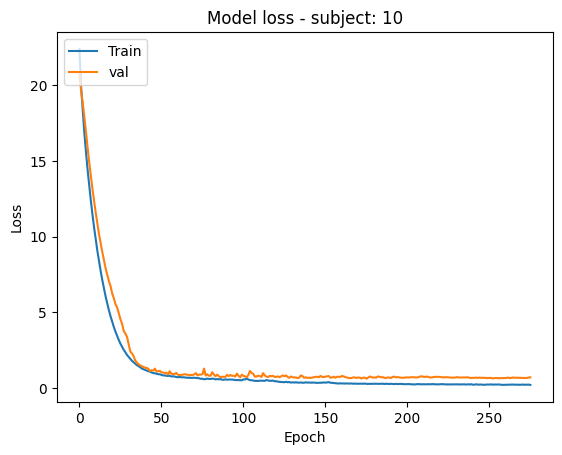


Training on subject  11
Creating RawArray with float64 data, n_channels=128, n_times=3386765
    Range : 0 ... 3386764 =      0.000 ...  6773.528 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3386765)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [ 3680  3505  3755  3620  3850  3955  3795  3760  3670  3545  3630  3515
  3645  3730  3715  3580  3830  3670  3640  3750  3850  3840  3805  3655
  3885  3780  3570  3885  3930  3620  3515  3855  3760  3

2025-05-30 17:36:31.645806: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 189: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 344ms/step
Subject: 11   seed 1   time: 1.7 m   valid_acc: 0.6364   valid_loss: 0.918
Plot Learning Curves ....... 


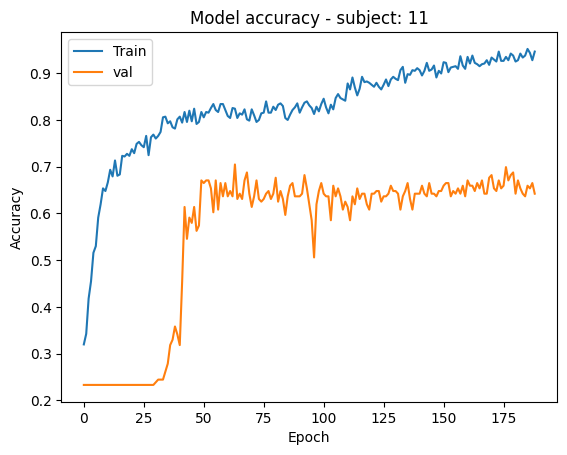

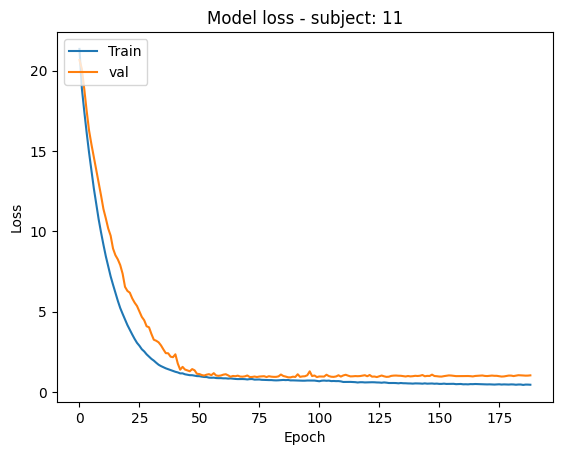


Training on subject  12
Creating RawArray with float64 data, n_channels=128, n_times=3385750
    Range : 0 ... 3385749 =      0.000 ...  6771.498 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3385750)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [ 3740  3525  3705  3505  3540  3605  3575  3955  3805  3990  3840  3785
  3700  3890  3965  4000  3875  3675  3550  3870  3510  3835  3745  3605
  3830  3755  3805  3950  3925  3835  3560  3820  3645  3

2025-05-30 17:39:32.512216: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-05-30 17:39:39.020891: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_38', 4 bytes spill stores, 4 bytes spill loads

2025-05-30 17:39:55.257875: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 321: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 345ms/step
Subject: 12   seed 1   time: 2.9 m   valid_acc: 0.9205   valid_loss: 0.348
Plot Learning Curves ....... 


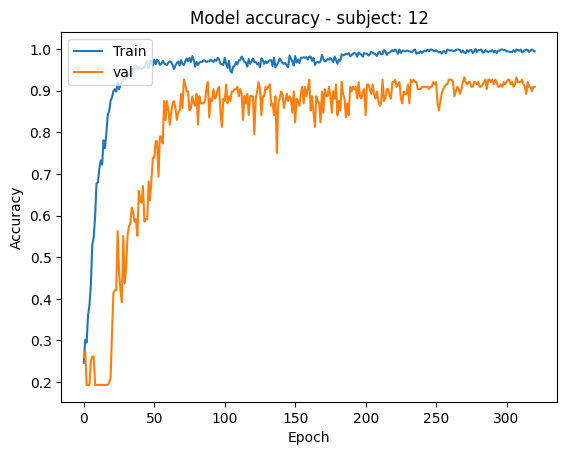

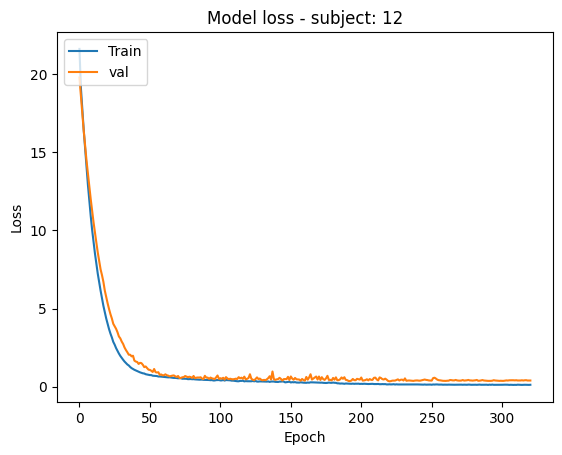


Training on subject  13
Creating RawArray with float64 data, n_channels=128, n_times=3032845
    Range : 0 ... 3032844 =      0.000 ...  6065.688 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3032845)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
800 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 800
Durate degli eventi: [3680 3965 3630 3575 3735 3865 3515 3980 3620 3670 3985 3700 3575 3900
 3850 3870 3730 3940 3505 3615 3980 3625 3985 3630 3765 3855 3645 3805
 3960 3935 3620 3560 3580 3625 3820 3610 3795 3815 3530 3850 

2025-05-30 17:43:28.772303: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 192: early stopping
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Subject: 13   seed 1   time: 1.7 m   valid_acc: 0.7375   valid_loss: 0.813
Plot Learning Curves ....... 


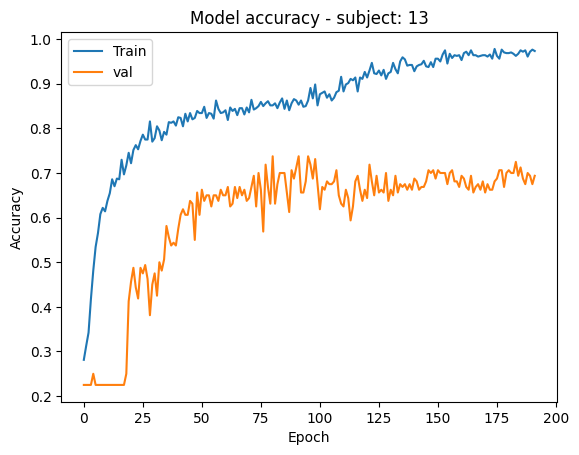

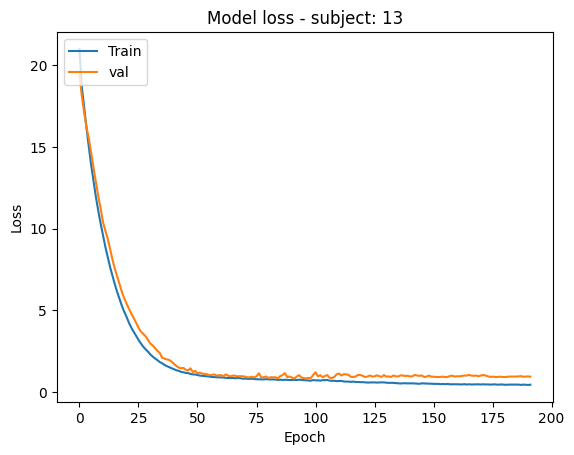


Training on subject  14
Creating RawArray with float64 data, n_channels=128, n_times=3345425
    Range : 0 ... 3345424 =      0.000 ...  6690.848 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 3345425)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, FC5, FC1, FC2, FC6, M1, T7, ...
 chs: 128 misc, 1 Stimulus
 custom_ref_applied: False
 dig: 0 items
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 129
 projs: []
 sfreq: 500.0 Hz
>
ANNOTAIONS: <Annotations | 0 segments>
Valori unici nel canale di Stimulus: [0. 2. 4. 6. 8.]
Tempo di un campione: 0.002
880 events found on stim channel STI 014
Event IDs: [2 4 6 8]
Numero di eventi: 880
Durate degli eventi: [3645 3695 3990 3845 3825 3790 3935 3930 3730 3775 3890 3965 3595 3995
 3725 3685 3760 3920 3880 3645 3675 3715 3630 3925 3915 3725 3645 3830
 3745 3700 3825 3790 3520 3915 3810 3725 3705 3805 3540 3550 

2025-05-30 17:46:19.375426: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads



Epoch 482: early stopping
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 359ms/step
Subject: 14   seed 1   time: 3.3 m   valid_acc: 0.9659   valid_loss: 0.173
Plot Learning Curves ....... 


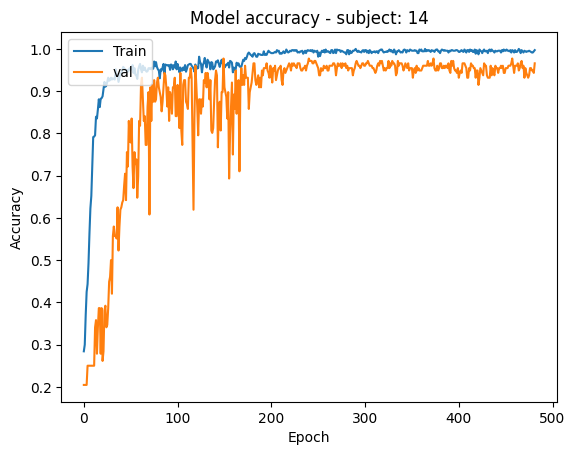

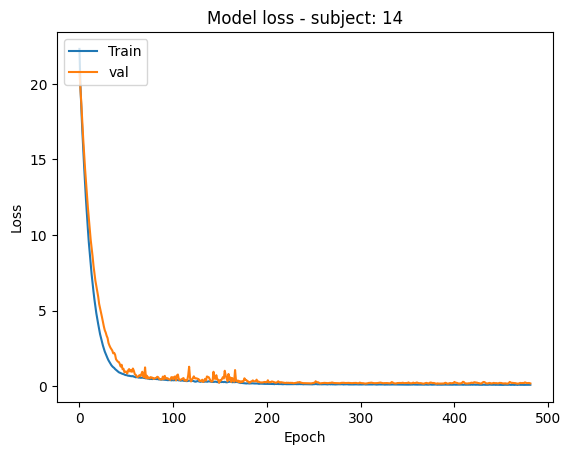


---------------------------------
Validation performance (acc %):
---------------------------------
         sub_1   sub_2   sub_3   sub_4   sub_5   sub_6   sub_7   sub_8   sub_9   sub_10   sub_11   sub_12   sub_13   sub_14     average
         -----   -----   -----   -----   -----   -----   -----   -----   -----   -----   -----   -----   -----   -----     -------
Seed 1:  89.06   73.62   86.36   97.77   79.17   77.14   81.55   77.10   76.70   85.98   63.64   92.05   73.75   96.59     82.18   
---------------------------------
Average acc - all seeds: 82.18 %

Train Time  - all seeds: 51.3 min
---------------------------------

Training completed!
Creating RawArray with float64 data, n_channels=128, n_times=1225545
    Range : 0 ... 1225544 =      0.000 ...  2451.088 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Dati grezzi CST_raw_mne: (129, 1225545)
RAW:  <Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fpz, F7, F3, Fz, F4, F8, 

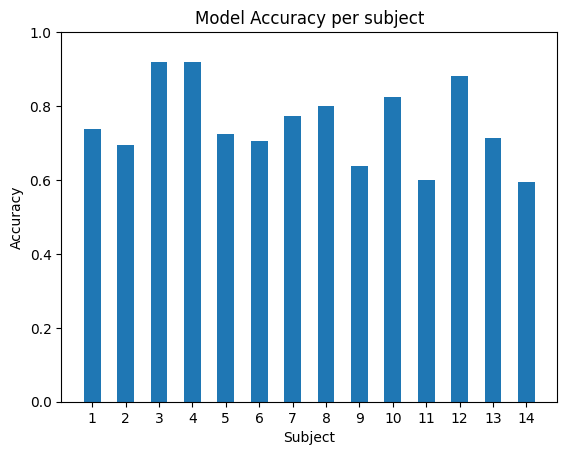

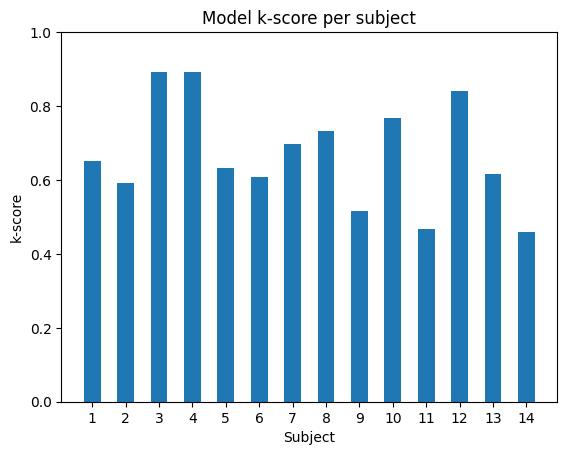

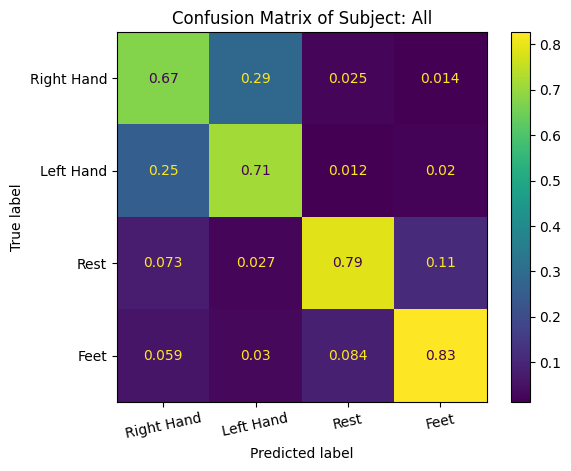

In [14]:
run("rdwt")